In [2]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point

In [3]:
data = gpd.read_file("C:\\geog328\\transit-walkshed\\assets\\data\\census.blocks.geojson")
data.head()

,OBJECTID,GEOID_20,ACRES_LAND,ACRES_WATER,PLACE,NAME,TRACT_NUMB,BLOCK,TRBL_STR,WATER,...,HU2024,OHU2024,POP_PER_ACRE_CURRENT,HU_PER_ACRE_CURRENT,POP2025,HHP2025,GQ2025,HU2025,OHU2025,geometry
0,1,530330036011002,1.717630,0.0,Seattle,Block 1002,3601,1002,3601.1002,0,...,0.000,0.000,0.000000,0.000000,0.000,0.000,0.0,0.000,0.000,"POLYGON ((-122.32 47.675, -122.32 47.676, -122..."
1,2,530330114013007,4.999683,0.0,Seattle,Block 3007,11401,3007,11401.3007,0,...,29.680,28.207,14.504719,5.934776,72.519,72.519,0.0,29.672,28.070,"POLYGON ((-122.36 47.53, -122.36 47.53, -122.3..."
2,3,530330044022009,2.154018,0.0,Seattle,Block 2009,4402,2009,4402.2009,0,...,38.991,35.779,35.982064,18.101523,77.506,77.506,0.0,38.991,35.620,"POLYGON ((-122.31 47.669, -122.31 47.669, -122..."
3,4,530330019001018,5.070850,0.0,Seattle,Block 1018,1900,1018,1900.1018,0,...,35.000,33.746,17.190808,6.902197,87.172,87.172,0.0,35.000,33.602,"POLYGON ((-122.32 47.691, -122.32 47.691, -122..."
4,5,530330110012001,0.486550,0.0,Seattle,Block 2001,11001,2001,11001.2001,0,...,0.000,0.000,0.000000,0.000000,0.000,0.000,0.0,0.000,0.000,"POLYGON ((-122.28 47.544, -122.28 47.544, -122..."


In [4]:
data.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

<Axes: >

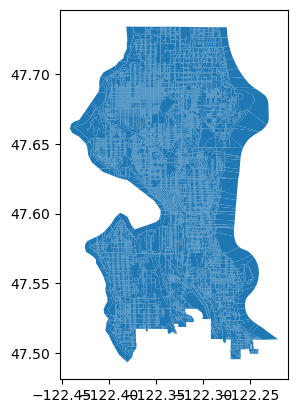

In [5]:
data.plot()

In [6]:
data_df = pd.DataFrame(data)
data.memory_usage(deep=True)

Index             132
OBJECTID        41172
GEOID_20       658752
ACRES_LAND      82344
ACRES_WATER     82344
                ...  
HHP2025         82344
GQ2025          82344
HU2025          82344
OHU2025         82344
geometry        82344
Length: 124, dtype: int64

In [7]:
data.columns.unique()
data.columns.tolist()

['OBJECTID',
 'GEOID_20',
 'ACRES_LAND',
 'ACRES_WATER',
 'PLACE',
 'NAME',
 'TRACT_NUMB',
 'BLOCK',
 'TRBL_STR',
 'WATER',
 'COUNTYNAME',
 'XCOORD',
 'YCOORD',
 'POP2010',
 'POP2011',
 'POP2012',
 'POP2013',
 'POP2014',
 'POP2015',
 'POP2016',
 'POP2017',
 'POP2018',
 'POP2019',
 'PL_Pop2020',
 'POP2020',
 'POP2021',
 'POP2022',
 'POP2023',
 'CPOP_FROM_20',
 'PCPOP_FROM_20',
 'HHP2010',
 'HHP2011',
 'HHP2012',
 'HHP2013',
 'HHP2014',
 'HHP2015',
 'HHP2016',
 'HHP2017',
 'HHP2018',
 'HHP2019',
 'PL_HHP2020',
 'HHP2020',
 'HHP2021',
 'HHP2022',
 'HHP2023',
 'CHHP_FROM_20',
 'PCHHP_FROM_20',
 'GQ2010',
 'GQ2011',
 'GQ2012',
 'GQ2013',
 'GQ2014',
 'GQ2015',
 'GQ2016',
 'GQ2017',
 'GQ2018',
 'GQ2019',
 'PL_GQ2020',
 'GQ2020',
 'GQ2021',
 'GQ2022',
 'GQ2023',
 'CGQ_FROM_20',
 'PCGQ_FROM_20',
 'HU2010',
 'HU2011',
 'HU2012',
 'HU2013',
 'HU2014',
 'HU2015',
 'HU2016',
 'HU2017',
 'HU2018',
 'HU2019',
 'PL_HU2020',
 'HU2020',
 'HU2021',
 'HU2022',
 'HU2023',
 'CHU_FROM_20',
 'PCHU_FROM_20',
 

In [8]:
census_cleaned = data[["TRACT_NUMB", "POP2025", "PCPOP_FROM_20", "geometry", "XCOORD", "YCOORD", "GEOID_20","POP2010", "POP2020", "NAME"]]
census_cleaned.head()
census_cleaned["10YR_GROWTH_PCT"] = ((census_cleaned["POP2020"] - census_cleaned["POP2010"]) / census_cleaned["POP2010"]) * 100
census_cleaned["10YR_GROWTH_PCT"].head(10)


c:\Users\turne\anaconda3\Lib\site-packages\geopandas\geodataframe.py:1968: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


0          NaN
1    -4.528830
2    -4.169766
3     3.908465
4          NaN
5    -1.073912
6    34.994158
7    12.168735
8    -2.908995
9     1.194407
Name: 10YR_GROWTH_PCT, dtype: float64

In [9]:
census_cleaned["5YR_GROWTH_PCT"] = ((census_cleaned["POP2025"] - census_cleaned["POP2020"]) / census_cleaned["POP2020"]) * 100
census_cleaned["5YR_GROWTH_PCT"].head(10)

c:\Users\turne\anaconda3\Lib\site-packages\geopandas\geodataframe.py:1968: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


0          NaN
1     8.519139
2    -1.361739
3    -1.296466
4          NaN
5    -1.332856
6     3.576458
7    15.237478
8    -1.655609
9     2.345702
Name: 5YR_GROWTH_PCT, dtype: float64

In [12]:
census_cleaned.head(15)

,TRACT_NUMB,POP2025,PCPOP_FROM_20,geometry,XCOORD,YCOORD,GEOID_20,POP2010,POP2020,NAME,10YR_GROWTH_PCT,5YR_GROWTH_PCT,POP2030
0,3601,0.000,0.0000,"POLYGON ((-122.32 47.675, -122.32 47.676, -122...",1.191952e+06,859163.429140,530330036011002,0.000,0.000,Block 1002,NaN,NaN,NaN
1,11401,72.519,8.5191,"POLYGON ((-122.36 47.53, -122.36 47.53, -122.3...",1.181305e+06,806209.740690,530330114013007,69.996,66.826,Block 3007,-4.528830,8.519139,63.799564
2,4402,77.506,-1.3617,"POLYGON ((-122.31 47.669, -122.31 47.669, -122...",1.193554e+06,856936.788986,530330044022009,81.995,78.576,Block 2009,-4.169766,-1.361739,75.299564
3,1900,87.172,-1.2965,"POLYGON ((-122.32 47.691, -122.32 47.691, -122...",1.191750e+06,864957.161542,530330019001018,84.995,88.317,Block 1018,3.908465,-1.296466,91.768839
4,11001,0.000,0.0000,"POLYGON ((-122.28 47.544, -122.28 47.544, -122...",1.199651e+06,811010.098135,530330110012001,0.000,0.000,Block 2001,NaN,NaN,NaN
5,5600,63.441,-1.3329,"POLYGON ((-122.39 47.637, -122.39 47.637, -122...",1.174027e+06,845587.917101,530330056005025,64.996,64.298,Block 5025,-1.073912,-1.332856,63.607496
6,5700,141.212,3.5765,"POLYGON ((-122.4 47.643, -122.4 47.643, -122.4...",1.172612e+06,847647.444782,530330057003014,100.994,136.336,Block 3014,34.994158,3.576458,184.045635
7,5700,28.436,15.2375,"POLYGON ((-122.39 47.651, -122.39 47.651, -122...",1.173694e+06,850808.373129,530330057002000,21.999,24.676,Block 2000,12.168735,15.237478,27.678757
8,11901,64.925,-1.6556,"POLYGON ((-122.26 47.499, -122.26 47.498, -122...",1.204848e+06,794231.878710,530330119013007,67.996,66.018,Block 3007,-2.908995,-1.655609,64.097540
9,5700,54.888,2.3457,"POLYGON ((-122.4 47.652, -122.4 47.652, -122.4...",1.171718e+06,851016.226172,530330057004019,52.997,53.630,Block 4019,1.194407,2.345702,54.270561


In [11]:
census_cleaned["POP2030"] = census_cleaned["POP2020"] * (1 + census_cleaned["10YR_GROWTH_PCT"] / 100)
census_cleaned.head()

c:\Users\turne\anaconda3\Lib\site-packages\geopandas\geodataframe.py:1968: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,TRACT_NUMB,POP2025,PCPOP_FROM_20,geometry,XCOORD,YCOORD,GEOID_20,POP2010,POP2020,NAME,10YR_GROWTH_PCT,5YR_GROWTH_PCT,POP2030
0,3601,0.000,0.0000,"POLYGON ((-122.32 47.675, -122.32 47.676, -122...",1.191952e+06,859163.429140,530330036011002,0.000,0.000,Block 1002,NaN,NaN,NaN
1,11401,72.519,8.5191,"POLYGON ((-122.36 47.53, -122.36 47.53, -122.3...",1.181305e+06,806209.740690,530330114013007,69.996,66.826,Block 3007,-4.528830,8.519139,63.799564
2,4402,77.506,-1.3617,"POLYGON ((-122.31 47.669, -122.31 47.669, -122...",1.193554e+06,856936.788986,530330044022009,81.995,78.576,Block 2009,-4.169766,-1.361739,75.299564
3,1900,87.172,-1.2965,"POLYGON ((-122.32 47.691, -122.32 47.691, -122...",1.191750e+06,864957.161542,530330019001018,84.995,88.317,Block 1018,3.908465,-1.296466,91.768839
4,11001,0.000,0.0000,"POLYGON ((-122.28 47.544, -122.28 47.544, -122...",1.199651e+06,811010.098135,530330110012001,0.000,0.000,Block 2001,NaN,NaN,NaN


In [21]:
import numpy as np
initial_pop = census_cleaned["POP2010"]
final_pop = census_cleaned["POP2025"]
years = 15
cagr = np.where(
    initial_pop > 0,
    ((final_pop / initial_pop) ** (1 / years)) - 1,
    np.nan
)
census_cleaned["avg_annual_growth_rate"] = cagr * 100
census_cleaned.head(10)

c:\Users\turne\anaconda3\Lib\site-packages\geopandas\geodataframe.py:1968: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,TRACT_NUMB,POP2025,PCPOP_FROM_20,geometry,XCOORD,YCOORD,GEOID_20,POP2010,POP2020,NAME,10YR_GROWTH_PCT,5YR_GROWTH_PCT,POP2030,avg_annual_growth_rate
0,3601,0.000,0.0000,"POLYGON ((-122.32 47.675, -122.32 47.676, -122...",1.191952e+06,859163.429140,530330036011002,0.000,0.000,Block 1002,NaN,NaN,NaN,NaN
1,11401,72.519,8.5191,"POLYGON ((-122.36 47.53, -122.36 47.53, -122.3...",1.181305e+06,806209.740690,530330114013007,69.996,66.826,Block 3007,-4.528830,8.519139,63.799564,0.236349
2,4402,77.506,-1.3617,"POLYGON ((-122.31 47.669, -122.31 47.669, -122...",1.193554e+06,856936.788986,530330044022009,81.995,78.576,Block 2009,-4.169766,-1.361739,75.299564,-0.374649
3,1900,87.172,-1.2965,"POLYGON ((-122.32 47.691, -122.32 47.691, -122...",1.191750e+06,864957.161542,530330019001018,84.995,88.317,Block 1018,3.908465,-1.296466,91.768839,0.168747
4,11001,0.000,0.0000,"POLYGON ((-122.28 47.544, -122.28 47.544, -122...",1.199651e+06,811010.098135,530330110012001,0.000,0.000,Block 2001,NaN,NaN,NaN,NaN
5,5600,63.441,-1.3329,"POLYGON ((-122.39 47.637, -122.39 47.637, -122...",1.174027e+06,845587.917101,530330056005025,64.996,64.298,Block 5025,-1.073912,-1.332856,63.607496,-0.161306
6,5700,141.212,3.5765,"POLYGON ((-122.4 47.643, -122.4 47.643, -122.4...",1.172612e+06,847647.444782,530330057003014,100.994,136.336,Block 3014,34.994158,3.576458,184.045635,2.259831
7,5700,28.436,15.2375,"POLYGON ((-122.39 47.651, -122.39 47.651, -122...",1.173694e+06,850808.373129,530330057002000,21.999,24.676,Block 2000,12.168735,15.237478,27.678757,1.725782
8,11901,64.925,-1.6556,"POLYGON ((-122.26 47.499, -122.26 47.498, -122...",1.204848e+06,794231.878710,530330119013007,67.996,66.018,Block 3007,-2.908995,-1.655609,64.097540,-0.307633
9,5700,54.888,2.3457,"POLYGON ((-122.4 47.652, -122.4 47.652, -122.4...",1.171718e+06,851016.226172,530330057004019,52.997,53.630,Block 4019,1.194407,2.345702,54.270561,0.234003


In [22]:
census_cleaned['avg_annual_growth_rate'].describe()

count    8388.000000
mean       -0.867473
std        15.214333
min      -100.000000
25%        -0.555890
50%         0.489146
75%         1.709001
max       112.005503
Name: avg_annual_growth_rate, dtype: float64

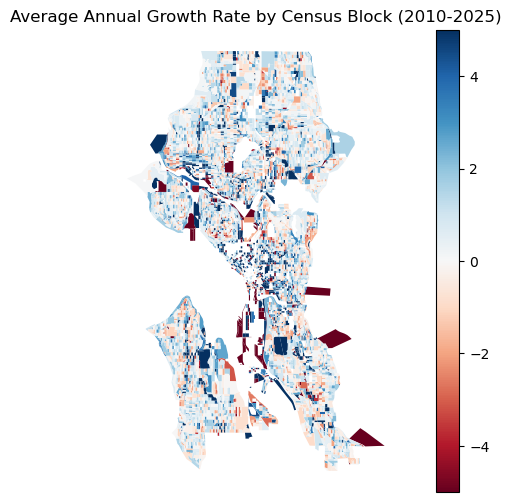

In [27]:
import matplotlib.pyplot as plt
fix, ax = plt.subplots(figsize=(10, 6))
census_cleaned.plot(column="avg_annual_growth_rate", 
                    ax=ax, 
                    legend=True, 
                    cmap="RdBu", 
                    vmin=-5,
                    vmax=5,
                    )
plt.title("Average Annual Growth Rate by Census Block (2010-2025)")
ax.set_axis_off()
plt.show()

In [24]:
census_cleaned.to_file("C:\\geog328\\transit-walkshed\\assets\\data\\census_cleaned.geojson", driver="GeoJSON")

c:\Users\turne\anaconda3\Lib\site-packages\pyogrio\raw.py:723: RuntimeWarning: NaN of Infinity value found. Skipped
  ogr_write(


In [32]:
import folium

# Create base map centered on Seattle
m = folium.Map(location=[47.6062, -122.3321],  # Seattle coordinates
               zoom_start=11,                   # Adjust zoom level
               tiles='OpenStreetMap')

# Add choropleth layer
folium.Choropleth(
    geo_data=census_cleaned,
    data=census_cleaned,
    columns=['GEOID_20', 'avg_annual_growth_rate'],  # Adjust GEOID to your ID column
    key_on='feature.properties.GEOID_20',
    fill_color='RdBu_r',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Annual Growth Rate (%)',
    nan_fill_color='lightgray',
    nan_fill_opacity=0.4,
).add_to(m)

# Display in notebook
m

# Or save to HTML
# m.save('growth_map.html')